<a href="https://colab.research.google.com/github/Leocdmx/Awesome-Profile-README-templates/blob/master/Analisis_Exploratorio_Cost_of_Living_2_MLS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
  #Librerias
import pandas as pd
import numpy as np

import seaborn as sns #libreria para graficar
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
import seaborn as sns
#ramdon 
import statsmodels.api as sm
import statsmodels.formula.api as smf

#import warnings
#warnings.filterwarnings("ignore")

#import plotly.express as px  

In [ ]:
#def get_box_plot_data(labels, bp):
 #   rows_list = []

  #  for i in range(len(labels)):
   #     dict1 = {}
   #     dict1['label'] = labels[i]
     #   dict1['lower_whisker'] = bp['whiskers'][i*2].get_ydata()[1]
    #    dict1['lower_quartile'] = bp['boxes'][i].get_ydata()[1]
      #  dict1['median'] = bp['medians'][i].get_ydata()[1]
       # dict1['upper_quartile'] = bp['boxes'][i].get_ydata()[2]
        #dict1['upper_whisker'] = bp['whiskers'][(i*2)+1].get_ydata()[1]
        #rows_list.append(dict1)

   # return pd.DataFrame(rows_list)

In [ ]:
# Leemos la información
raw_data = pd.read_csv("cost-of-living-2.csv")
print("El dataset cuenta con \033[1m{} renglones\033[0m y \033[1m{} columnas\033[0m \n".format(raw_data.shape[0], raw_data.shape[1]))


# determinamos el número de valores vacios por columna
print("El data set cuenta con el siguiente numero de \033[1mvalores faltantes \033[0m para cada columna.\n\033[1m{}\033[0m".format(raw_data.isnull().sum()))



El dataset cuenta con 4779 renglones y 59 columnas 

El data set cuenta con el siguiente numero de valores faltantes  para cada columna.
Unnamed: 0         0
city               0
country            0
x1               419
x2               432
x3               308
x4               483
x5               421
x6               325
x7               430
x8               297
x9               365
x10              405
x11              327
x12              498
x13              461
x14              548
x15              553
x16              350
x17              362
x18              424
x19              452
x20              417
x21              415
x22              476
x23              375
x24              448
x25              707
x26              633
x27              468
x28             1428
x29             2063
x30              833
x31              973
x32             1334
x33              568
x34              987
x35              925
x36              453
x37             1149
x38              317
x3

In [ ]:
#Quitaremos las columnas ,"Unnamed: 0 "
#"data_quality" -> Es un indicador el cual no se explica su construcción, pero se describe como "0 si Número de considera que se necesitan más contribuyentes para aumentar la calidad de los datos"
#Quitaremos la columna "x55" ya que es una tasa de interes y para terminos de este ejercicio no aporta al objetivo

raw_data.drop(['Unnamed: 0', 'data_quality','x55'], axis = 'columns', inplace=True)


In [ ]:
raw_data = raw_data[~raw_data['x54'].isnull()]

raw_data

,city,country,x1,x2,x3,x4,x5,x6,x7,x8,...,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54
0,Delhi,India,4.90,22.04,4.28,1.84,3.67,1.78,0.48,0.19,...,33.34,49.35,36.26,223.87,133.38,596.16,325.82,2619.46,1068.90,586.35
1,Shanghai,China,5.59,40.51,5.59,1.12,4.19,3.96,0.52,0.32,...,34.26,86.55,121.19,1080.07,564.30,2972.57,1532.23,17333.09,9174.88,1382.83
2,Jakarta,Indonesia,2.54,22.25,3.50,2.02,3.18,2.19,0.59,0.27,...,25.95,72.89,80.32,482.85,270.15,1117.69,584.37,2694.05,1269.44,483.19
3,Manila,Philippines,3.54,27.40,3.54,1.24,1.90,2.91,0.93,0.51,...,26.96,69.47,61.82,559.52,281.78,1754.40,684.81,3536.04,2596.44,419.02
4,Seoul,South Korea,7.16,52.77,6.03,3.02,4.52,3.86,1.46,0.78,...,45.49,70.21,108.30,809.83,583.60,2621.05,1683.74,21847.94,10832.90,2672.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4768,Tirupati,India,2.45,9.18,4.28,2.11,3.06,2.01,0.46,0.13,...,14.39,38.77,37.13,82.64,61.21,183.64,128.55,658.89,395.34,612.13
4769,Port Douglas,Australia,15.76,66.39,10.06,5.36,4.86,3.45,2.21,2.28,...,31.30,73.77,62.03,NaN,NaN,NaN,NaN,NaN,NaN,5867.96
4770,Rockhampton,Australia,13.41,63.71,8.05,4.19,3.35,3.35,2.70,2.35,...,20.12,105.96,53.65,771.28,586.80,938.87,894.17,5030.32,3966.34,3435.18
4772,Egilsstadhir,Iceland,17.30,70.61,8.47,4.24,3.53,3.95,1.77,1.41,...,56.49,141.22,145.46,635.50,529.59,1694.68,1412.23,2012.43,1765.29,2471.40


In [ ]:
#haremos las variables en % con respecto a los ingresos

raw_data_percentage = raw_data['country'].to_frame()
for i in range(1, 54):
    raw_data_percentage[f'%x{i}'] =  raw_data[f'x{i}'] / 1
raw_data_percentage

,country,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,...,%x44,%x45,%x46,%x47,%x48,%x49,%x50,%x51,%x52,%x53
0,India,4.90,22.04,4.28,1.84,3.67,1.78,0.48,0.19,0.73,...,32.05,33.34,49.35,36.26,223.87,133.38,596.16,325.82,2619.46,1068.90
1,China,5.59,40.51,5.59,1.12,4.19,3.96,0.52,0.32,2.68,...,69.17,34.26,86.55,121.19,1080.07,564.30,2972.57,1532.23,17333.09,9174.88
2,Indonesia,2.54,22.25,3.50,2.02,3.18,2.19,0.59,0.27,1.28,...,38.87,25.95,72.89,80.32,482.85,270.15,1117.69,584.37,2694.05,1269.44
3,Philippines,3.54,27.40,3.54,1.24,1.90,2.91,0.93,0.51,1.63,...,38.45,26.96,69.47,61.82,559.52,281.78,1754.40,684.81,3536.04,2596.44
4,South Korea,7.16,52.77,6.03,3.02,4.52,3.86,1.46,0.78,2.13,...,56.99,45.49,70.21,108.30,809.83,583.60,2621.05,1683.74,21847.94,10832.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4768,India,2.45,9.18,4.28,2.11,3.06,2.01,0.46,0.13,0.58,...,30.69,14.39,38.77,37.13,82.64,61.21,183.64,128.55,658.89,395.34
4769,Australia,15.76,66.39,10.06,5.36,4.86,3.45,2.21,2.28,1.29,...,62.87,31.30,73.77,62.03,NaN,NaN,NaN,NaN,NaN,NaN
4770,Australia,13.41,63.71,8.05,4.19,3.35,3.35,2.70,2.35,1.14,...,92.77,20.12,105.96,53.65,771.28,586.80,938.87,894.17,5030.32,3966.34
4772,Iceland,17.30,70.61,8.47,4.24,3.53,3.95,1.77,1.41,1.06,...,118.86,56.49,141.22,145.46,635.50,529.59,1694.68,1412.23,2012.43,1765.29


In [ ]:
raw_data_percentage['NaN_count'] = raw_data_percentage.iloc[:,2:57].isnull().sum(axis=1)

raw_data_percentage

,country,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,...,%x45,%x46,%x47,%x48,%x49,%x50,%x51,%x52,%x53,NaN_count
0,India,4.90,22.04,4.28,1.84,3.67,1.78,0.48,0.19,0.73,...,33.34,49.35,36.26,223.87,133.38,596.16,325.82,2619.46,1068.90,0
1,China,5.59,40.51,5.59,1.12,4.19,3.96,0.52,0.32,2.68,...,34.26,86.55,121.19,1080.07,564.30,2972.57,1532.23,17333.09,9174.88,0
2,Indonesia,2.54,22.25,3.50,2.02,3.18,2.19,0.59,0.27,1.28,...,25.95,72.89,80.32,482.85,270.15,1117.69,584.37,2694.05,1269.44,0
3,Philippines,3.54,27.40,3.54,1.24,1.90,2.91,0.93,0.51,1.63,...,26.96,69.47,61.82,559.52,281.78,1754.40,684.81,3536.04,2596.44,0
4,South Korea,7.16,52.77,6.03,3.02,4.52,3.86,1.46,0.78,2.13,...,45.49,70.21,108.30,809.83,583.60,2621.05,1683.74,21847.94,10832.90,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4768,India,2.45,9.18,4.28,2.11,3.06,2.01,0.46,0.13,0.58,...,14.39,38.77,37.13,82.64,61.21,183.64,128.55,658.89,395.34,0
4769,Australia,15.76,66.39,10.06,5.36,4.86,3.45,2.21,2.28,1.29,...,31.30,73.77,62.03,NaN,NaN,NaN,NaN,NaN,NaN,10
4770,Australia,13.41,63.71,8.05,4.19,3.35,3.35,2.70,2.35,1.14,...,20.12,105.96,53.65,771.28,586.80,938.87,894.17,5030.32,3966.34,1
4772,Iceland,17.30,70.61,8.47,4.24,3.53,3.95,1.77,1.41,1.06,...,56.49,141.22,145.46,635.50,529.59,1694.68,1412.23,2012.43,1765.29,0


[Text(0.5, 0, 'NaN count'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Histogram of Cities NaN Count')]

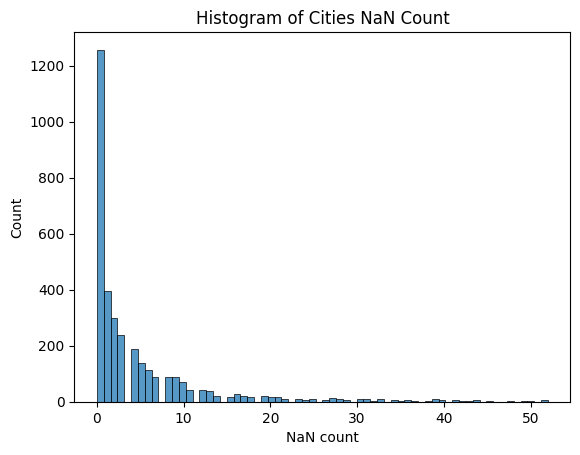

In [ ]:
axes = sns.histplot(x=raw_data_percentage['NaN_count'])

axes.set(xlabel='NaN count',
       ylabel='Count',
       title='Histogram of Cities NaN Count')


In [ ]:
qual_data = raw_data_percentage.drop(raw_data_percentage[raw_data_percentage['NaN_count'] > 0].index)
qual_data

,country,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,...,%x45,%x46,%x47,%x48,%x49,%x50,%x51,%x52,%x53,NaN_count
0,India,4.90,22.04,4.28,1.84,3.67,1.78,0.48,0.19,0.73,...,33.34,49.35,36.26,223.87,133.38,596.16,325.82,2619.46,1068.90,0
1,China,5.59,40.51,5.59,1.12,4.19,3.96,0.52,0.32,2.68,...,34.26,86.55,121.19,1080.07,564.30,2972.57,1532.23,17333.09,9174.88,0
2,Indonesia,2.54,22.25,3.50,2.02,3.18,2.19,0.59,0.27,1.28,...,25.95,72.89,80.32,482.85,270.15,1117.69,584.37,2694.05,1269.44,0
3,Philippines,3.54,27.40,3.54,1.24,1.90,2.91,0.93,0.51,1.63,...,26.96,69.47,61.82,559.52,281.78,1754.40,684.81,3536.04,2596.44,0
4,South Korea,7.16,52.77,6.03,3.02,4.52,3.86,1.46,0.78,2.13,...,45.49,70.21,108.30,809.83,583.60,2621.05,1683.74,21847.94,10832.90,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4632,Germany,15.58,51.93,8.31,4.15,4.15,3.40,2.54,2.35,1.10,...,33.76,97.93,119.45,804.99,640.53,2129.33,1256.82,7042.36,4050.92,0
4637,United States,12.00,40.00,10.50,7.00,6.00,5.15,2.48,1.92,1.39,...,43.33,87.17,101.67,1800.00,2000.00,3000.00,2400.00,3821.19,2852.44,0
4751,Ukraine,2.71,12.17,2.68,0.67,1.08,0.68,0.24,0.13,0.74,...,27.03,59.24,60.87,108.21,94.68,162.31,121.74,236.71,229.94,0
4768,India,2.45,9.18,4.28,2.11,3.06,2.01,0.46,0.13,0.58,...,14.39,38.77,37.13,82.64,61.21,183.64,128.55,658.89,395.34,0


In [ ]:
#quitamos la variable NaN_count que usamos para visualizar 
qual_data.drop(['NaN_count'], axis = 'columns', inplace=True)

In [ ]:
qual_data

,country,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,...,%x44,%x45,%x46,%x47,%x48,%x49,%x50,%x51,%x52,%x53
0,India,4.90,22.04,4.28,1.84,3.67,1.78,0.48,0.19,0.73,...,32.05,33.34,49.35,36.26,223.87,133.38,596.16,325.82,2619.46,1068.90
1,China,5.59,40.51,5.59,1.12,4.19,3.96,0.52,0.32,2.68,...,69.17,34.26,86.55,121.19,1080.07,564.30,2972.57,1532.23,17333.09,9174.88
2,Indonesia,2.54,22.25,3.50,2.02,3.18,2.19,0.59,0.27,1.28,...,38.87,25.95,72.89,80.32,482.85,270.15,1117.69,584.37,2694.05,1269.44
3,Philippines,3.54,27.40,3.54,1.24,1.90,2.91,0.93,0.51,1.63,...,38.45,26.96,69.47,61.82,559.52,281.78,1754.40,684.81,3536.04,2596.44
4,South Korea,7.16,52.77,6.03,3.02,4.52,3.86,1.46,0.78,2.13,...,56.99,45.49,70.21,108.30,809.83,583.60,2621.05,1683.74,21847.94,10832.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4632,Germany,15.58,51.93,8.31,4.15,4.15,3.40,2.54,2.35,1.10,...,83.62,33.76,97.93,119.45,804.99,640.53,2129.33,1256.82,7042.36,4050.92
4637,United States,12.00,40.00,10.50,7.00,6.00,5.15,2.48,1.92,1.39,...,56.25,43.33,87.17,101.67,1800.00,2000.00,3000.00,2400.00,3821.19,2852.44
4751,Ukraine,2.71,12.17,2.68,0.67,1.08,0.68,0.24,0.13,0.74,...,33.82,27.03,59.24,60.87,108.21,94.68,162.31,121.74,236.71,229.94
4768,India,2.45,9.18,4.28,2.11,3.06,2.01,0.46,0.13,0.58,...,30.69,14.39,38.77,37.13,82.64,61.21,183.64,128.55,658.89,395.34


In [ ]:
#sacamos la lista de paises para cruzarlos con nuestro dataframe
#paises=raw_data[["city","country"]].drop_duplicates().sort_values(by="country")

In [ ]:
#paises.to_excel('paises.xlsx')

In [ ]:
#qual_data.to_excel('qualdata.xlsx')

In [ ]:
flag = pd.read_csv("Clasificacion_ingresos .csv")

In [ ]:
Flag_data = left_join = pd.merge(qual_data,flag, how='left', on='country')
#quitamos las columnas basuras
Flag_data.drop(['Unnamed: 2', 'Unnamed: 3'], axis = 'columns', inplace=True)
Flag_data

,country,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,...,%x45,%x46,%x47,%x48,%x49,%x50,%x51,%x52,%x53,Clasificacion
0,India,4.90,22.04,4.28,1.84,3.67,1.78,0.48,0.19,0.73,...,33.34,49.35,36.26,223.87,133.38,596.16,325.82,2619.46,1068.90,Middle income
1,China,5.59,40.51,5.59,1.12,4.19,3.96,0.52,0.32,2.68,...,34.26,86.55,121.19,1080.07,564.30,2972.57,1532.23,17333.09,9174.88,Middle income
2,Indonesia,2.54,22.25,3.50,2.02,3.18,2.19,0.59,0.27,1.28,...,25.95,72.89,80.32,482.85,270.15,1117.69,584.37,2694.05,1269.44,Middle income
3,Philippines,3.54,27.40,3.54,1.24,1.90,2.91,0.93,0.51,1.63,...,26.96,69.47,61.82,559.52,281.78,1754.40,684.81,3536.04,2596.44,Middle income
4,South Korea,7.16,52.77,6.03,3.02,4.52,3.86,1.46,0.78,2.13,...,45.49,70.21,108.30,809.83,583.60,2621.05,1683.74,21847.94,10832.90,High income
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252,Germany,15.58,51.93,8.31,4.15,4.15,3.40,2.54,2.35,1.10,...,33.76,97.93,119.45,804.99,640.53,2129.33,1256.82,7042.36,4050.92,High income
1253,United States,12.00,40.00,10.50,7.00,6.00,5.15,2.48,1.92,1.39,...,43.33,87.17,101.67,1800.00,2000.00,3000.00,2400.00,3821.19,2852.44,High income
1254,Ukraine,2.71,12.17,2.68,0.67,1.08,0.68,0.24,0.13,0.74,...,27.03,59.24,60.87,108.21,94.68,162.31,121.74,236.71,229.94,Middle income
1255,India,2.45,9.18,4.28,2.11,3.06,2.01,0.46,0.13,0.58,...,14.39,38.77,37.13,82.64,61.21,183.64,128.55,658.89,395.34,Middle income


In [ ]:
dummie_data=pd.get_dummies(data=Flag_data, columns=['Clasificacion '])

dummie_data
dummie_data.to_excel("valores.xlsx")

In [ ]:
#dummie_data=dummie_data.drop([111,150,184,219,338,339,425,685], axis=0, inplace=True)

In [ ]:
print("El dataset cuenta con \033[1m{} renglones\033[0m y \033[1m{} columnas\033[0m \n".format(Flag_data.shape[0], Flag_data.shape[1]))
# determinamos el número de valores vacios por columna
print("El data set cuenta con el siguiente numero de \033[1mvalores faltantes \033[0m para cada columna.\n\033[1m{}\033[0m".format(Flag_data.isnull().sum()))


El dataset cuenta con 1257 renglones y 55 columnas 

El data set cuenta con el siguiente numero de valores faltantes  para cada columna.
country           0
%x1               0
%x2               0
%x3               0
%x4               0
%x5               0
%x6               0
%x7               0
%x8               0
%x9               0
%x10              0
%x11              0
%x12              0
%x13              0
%x14              0
%x15              0
%x16              0
%x17              0
%x18              0
%x19              0
%x20              0
%x21              0
%x22              0
%x23              0
%x24              0
%x25              0
%x26              0
%x27              0
%x28              0
%x29              0
%x30              0
%x31              0
%x32              0
%x33              0
%x34              0
%x35              0
%x36              0
%x37              0
%x38              0
%x39              0
%x40              0
%x41              0
%x42              0
%x4

In [ ]:
dummie_corr=dummie_data.corr(numeric_only = True)
dummie_corr

,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,%x10,...,%x48,%x49,%x50,%x51,%x52,%x53,Clasificacion _#N/D,Clasificacion _High income,Clasificacion _Low Income,Clasificacion _Middle income
%x1,1.000000,0.882567,0.811327,0.741711,0.677054,0.676857,0.832733,0.784759,0.213627,0.672738,...,0.618483,0.658972,0.575082,0.621552,0.190583,0.331070,-0.033630,0.721778,-0.056345,-0.710265
%x2,0.882567,1.000000,0.825957,0.787608,0.719183,0.710627,0.832308,0.804022,0.314577,0.685965,...,0.601533,0.636486,0.589328,0.619154,0.226554,0.375911,-0.021116,0.707587,-0.038445,-0.700976
%x3,0.811327,0.825957,1.000000,0.740198,0.669812,0.645261,0.823021,0.801812,0.286751,0.661843,...,0.507207,0.547204,0.480459,0.513578,0.243469,0.387138,-0.043766,0.657376,0.016604,-0.656553
%x4,0.741711,0.787608,0.740198,1.000000,0.884739,0.704577,0.737556,0.696489,0.248566,0.634504,...,0.570699,0.603331,0.516896,0.556488,0.190878,0.312598,-0.023927,0.660706,-0.079550,-0.646408
%x5,0.677054,0.719183,0.669812,0.884739,1.000000,0.752658,0.619618,0.581719,0.294458,0.683949,...,0.587537,0.610776,0.545751,0.575484,0.191552,0.291586,-0.030709,0.545700,-0.068495,-0.531754
%x6,0.676857,0.710627,0.645261,0.704577,0.752658,1.000000,0.608986,0.627253,0.400369,0.754100,...,0.628708,0.648874,0.602850,0.619778,0.217991,0.333741,0.024885,0.534454,-0.008250,-0.539210
%x7,0.832733,0.832308,0.823021,0.737556,0.619618,0.608986,1.000000,0.903235,0.199556,0.635304,...,0.506934,0.553848,0.485278,0.528969,0.210206,0.336176,-0.030666,0.749758,-0.042667,-0.741167
%x8,0.784759,0.804022,0.801812,0.696489,0.581719,0.627253,0.903235,1.000000,0.174005,0.629547,...,0.509187,0.549262,0.483595,0.522978,0.213646,0.349914,-0.028577,0.720408,-0.027230,-0.714649
%x9,0.213627,0.314577,0.286751,0.248566,0.294458,0.400369,0.199556,0.174005,1.000000,0.357343,...,0.199967,0.183222,0.237792,0.208364,0.241797,0.309143,0.275879,0.080200,0.030348,-0.127538
%x10,0.672738,0.685965,0.661843,0.634504,0.683949,0.754100,0.635304,0.629547,0.357343,1.000000,...,0.605792,0.636523,0.592910,0.616828,0.183657,0.293521,0.032156,0.519074,-0.053049,-0.517176


In [ ]:
dummie_corr.to_excel("corr_clasificacion.xlsx")

            %x1       %x2       %x3       %x4       %x5       %x6       %x7  \
count  8.000000  8.000000  8.000000  8.000000  8.000000  8.000000  8.000000   
mean   0.800876  0.820284  0.789673  0.786610  0.738098  0.715777  0.794682   
std    0.108180  0.092530  0.110163  0.104603  0.140177  0.124225  0.134164   
min    0.676857  0.710627  0.645261  0.696489  0.581719  0.608986  0.608986   
25%    0.725547  0.770502  0.722601  0.729311  0.657263  0.640759  0.708071   
50%    0.798043  0.814989  0.806570  0.740955  0.698119  0.690717  0.827664   
75%    0.845192  0.844873  0.823755  0.811891  0.785678  0.721135  0.850358   
max    1.000000  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   

            %x8  
count  8.000000  
mean   0.774911  
std    0.138397  
min    0.581719  
25%    0.679180  
50%    0.793285  
75%    0.828825  
max    1.000000  


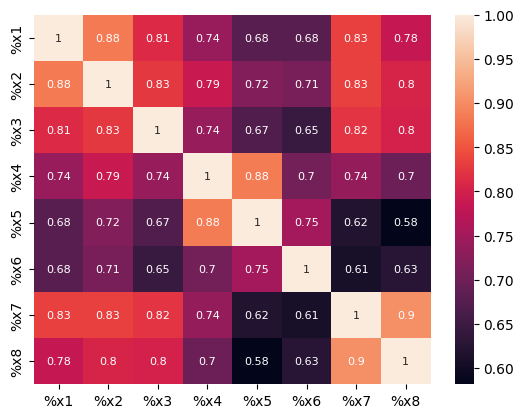

In [ ]:
alimentos_restaurantes=dummie_data[['%x1','%x2','%x3','%x4','%x5','%x6','%x7','%x8']]
sns.heatmap(alimentos_restaurantes.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(alimentos_restaurantes.corr().describe())
alimentos_restaurantes.corr().describe().to_excel('alimentos.xlsx')

#Elegimos %x4 y %x7

             %x9       %x10       %x11       %x12       %x13       %x14  \
count  15.000000  15.000000  15.000000  15.000000  15.000000  15.000000   
mean    0.383380   0.652075   0.620279   0.625594   0.499365   0.644876   
std     0.176773   0.154473   0.165201   0.140977   0.155524   0.153617   
min     0.268813   0.357343   0.271845   0.392947   0.318810   0.295682   
25%     0.306176   0.591381   0.532732   0.565899   0.428709   0.605042   
50%     0.346254   0.687097   0.664977   0.604833   0.451119   0.638552   
75%     0.391424   0.711924   0.690805   0.646170   0.518814   0.693498   
max     1.000000   1.000000   1.000000   1.000000   1.000000   1.000000   

            %x15       %x16       %x17       %x18       %x19       %x20  \
count  15.000000  15.000000  15.000000  15.000000  15.000000  15.000000   
mean    0.535414   0.638056   0.544653   0.675579   0.662726   0.678183   
std     0.157486   0.180662   0.155880   0.170700   0.168240   0.176544   
min     0.383100   0.316

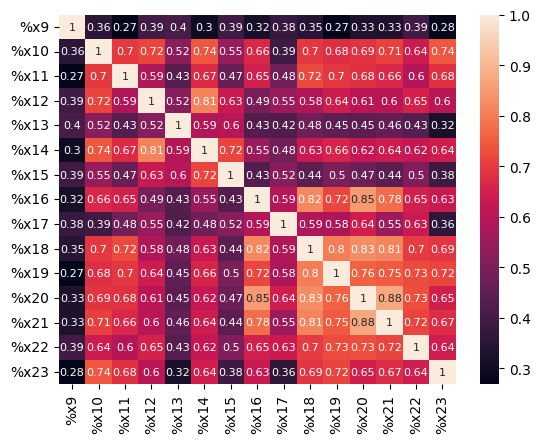

In [ ]:
alimentos_super=dummie_data[["%x9","%x10","%x11","%x12","%x13","%x14","%x15","%x16","%x17","%x18","%x19","%x20","%x21","%x22","%x23"]]
sns.heatmap(alimentos_super.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(alimentos_super.corr().describe())
alimentos_super.corr().describe().to_excel('alimentossuper.xlsx')
#Elegimos %x13 y %x23

           %x24      %x25      %x26      %x27
count  4.000000  4.000000  4.000000  4.000000
mean   0.615765  0.738173  0.676186  0.596236
std    0.276023  0.188694  0.255139  0.291387
min    0.346589  0.588685  0.425654  0.346589
25%    0.482487  0.606696  0.502253  0.405888
50%    0.558235  0.682003  0.639546  0.519177
75%    0.691514  0.813479  0.813479  0.709525
max    1.000000  1.000000  1.000000  1.000000


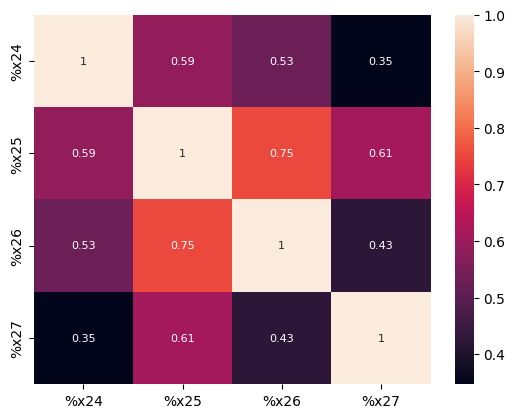

In [ ]:
bar=dummie_data[['%x24','%x25','%x26','%x27']]
sns.heatmap(bar.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(bar.corr().describe())

bar.corr().describe().to_excel('vicios.xlsx')

#Elegimos %x27 y %x24

           %x28      %x29      %x30      %x31      %x32      %x33      %x34  \
count  8.000000  8.000000  8.000000  8.000000  8.000000  8.000000  8.000000   
mean   0.586109  0.517708  0.555133  0.518135  0.559795  0.489296  0.333610   
std    0.285829  0.292956  0.265757  0.303323  0.284710  0.281532  0.336720   
min    0.159346  0.101350  0.176809  0.071942  0.151498  0.105458  0.105458   
25%    0.501263  0.378827  0.433516  0.376881  0.452373  0.373148  0.149135   
50%    0.642950  0.535689  0.599006  0.593890  0.616602  0.506734  0.174146   
75%    0.707734  0.627130  0.661806  0.644180  0.689399  0.594551  0.340500   
max    1.000000  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   

           %x35  
count  8.000000  
mean   0.317022  
std    0.346672  
min    0.071942  
25%    0.136677  
50%    0.155422  
75%    0.314301  
max    1.000000  


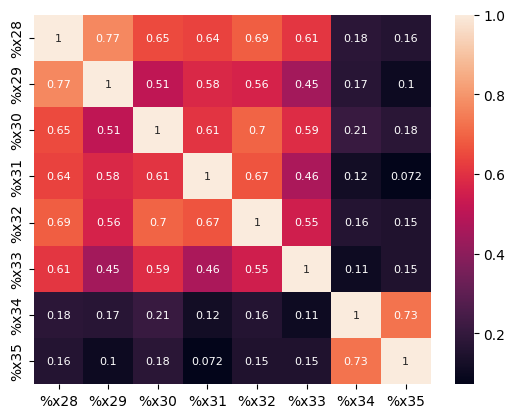

In [ ]:
mobility=dummie_data[['%x28','%x29','%x30','%x31','%x32','%x33','%x34','%x35']]
sns.heatmap(mobility.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(mobility.corr().describe())

mobility.corr().describe().to_excel('movilidad.xlsx')

#Elegimos %x28 y %x33, cabe mencionar que las variables %x35 y %x34 se elimiaron por la cantidad de datos nulos que presentan. 

           %x36      %x37      %x38      %x39      %x40      %x41
count  6.000000  6.000000  6.000000  6.000000  6.000000  6.000000
mean   0.492845  0.417281  0.507540  0.470374  0.433285  0.599796
std    0.284186  0.293994  0.265642  0.276148  0.288563  0.222249
min    0.287244  0.220733  0.269760  0.220733  0.224386  0.374307
25%    0.305653  0.243185  0.385496  0.336696  0.274131  0.460156
50%    0.355903  0.336945  0.389573  0.383200  0.331220  0.561453
75%    0.590814  0.382087  0.556542  0.481239  0.426143  0.646743
max    1.000000  1.000000  1.000000  1.000000  1.000000  1.000000


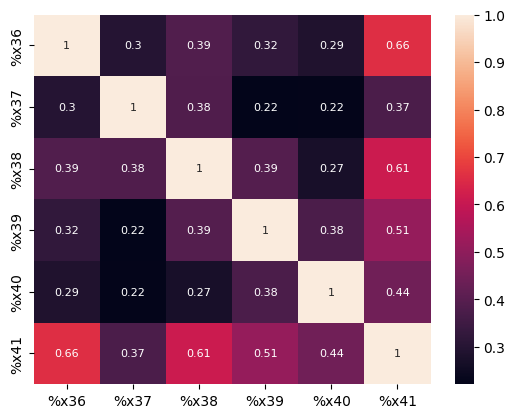

In [ ]:
entertainment=dummie_data[['%x36','%x37','%x38','%x39','%x40','%x41']]
sns.heatmap(entertainment.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(entertainment.corr().describe())

entertainment.corr().describe().to_excel('entertainment.xlsx')

#Elegimos %x38 y %x41

           %x42      %x43
count  2.000000  2.000000
mean   0.814666  0.814666
std    0.262102  0.262102
min    0.629332  0.629332
25%    0.721999  0.721999
50%    0.814666  0.814666
75%    0.907333  0.907333
max    1.000000  1.000000


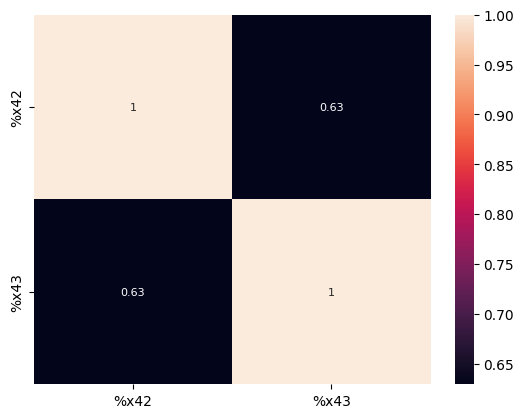

In [ ]:
school=dummie_data[['%x42','%x43']]
sns.heatmap(school.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(school.corr().describe())

school.corr().describe().to_excel('school.xlsx')

#Elegimos %x42

           %x44      %x45      %x46      %x47
count  4.000000  4.000000  4.000000  4.000000
mean   0.645323  0.622108  0.660290  0.703740
std    0.255743  0.253786  0.239690  0.211067
min    0.456793  0.456793  0.459603  0.500073
25%    0.458901  0.489253  0.513574  0.612514
50%    0.562248  0.515819  0.590779  0.657444
75%    0.748670  0.648674  0.737495  0.748670
max    1.000000  1.000000  1.000000  1.000000


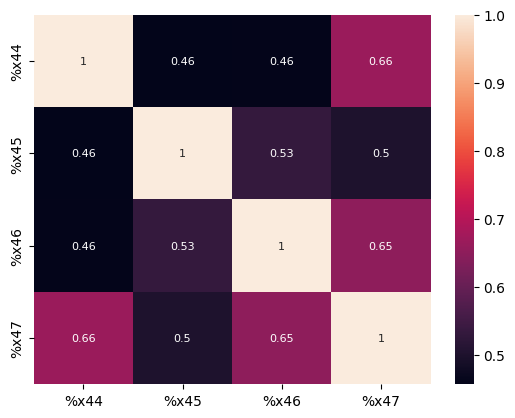

In [ ]:
dress=dummie_data[['%x44','%x45','%x46','%x47']]
sns.heatmap(dress.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(dress.corr().describe())
dress.corr().describe().to_excel('dress.xlsx')

#Elegimos %x45 y%47

           %x48      %x49      %x50      %x51      %x52      %x53
count  6.000000  6.000000  6.000000  6.000000  6.000000  6.000000
mean   0.723836  0.723261  0.720399  0.725649  0.451808  0.528502
std    0.359493  0.355483  0.352473  0.356028  0.375837  0.316902
min    0.210482  0.208937  0.213888  0.209528  0.208937  0.316510
25%    0.467277  0.471800  0.469096  0.478406  0.209767  0.326960
50%    0.920446  0.912916  0.908893  0.924468  0.212185  0.330217
75%    0.961677  0.963254  0.953388  0.955399  0.704479  0.733700
max    1.000000  1.000000  1.000000  1.000000  1.000000  1.000000


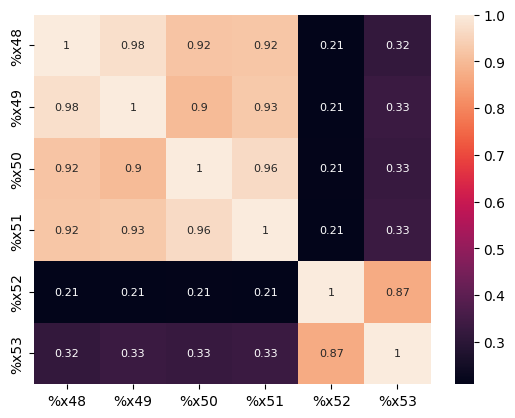

In [ ]:
living=dummie_data[['%x48','%x49','%x50','%x51','%x52','%x53']]
sns.heatmap(living.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(living.corr().describe())
living.corr().describe().to_excel('living.xlsx')

#Elegimos %x48, cabe mencionar que las variables %x52, %x53 se eliminaron por la cantif

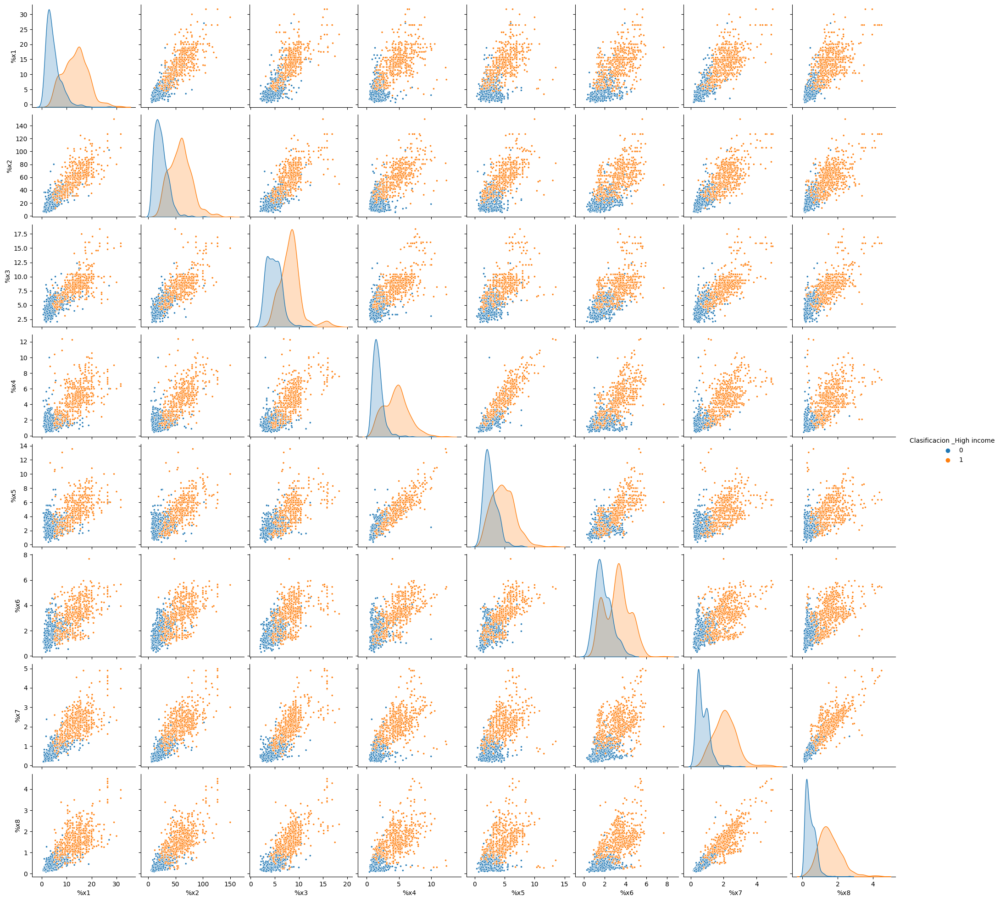

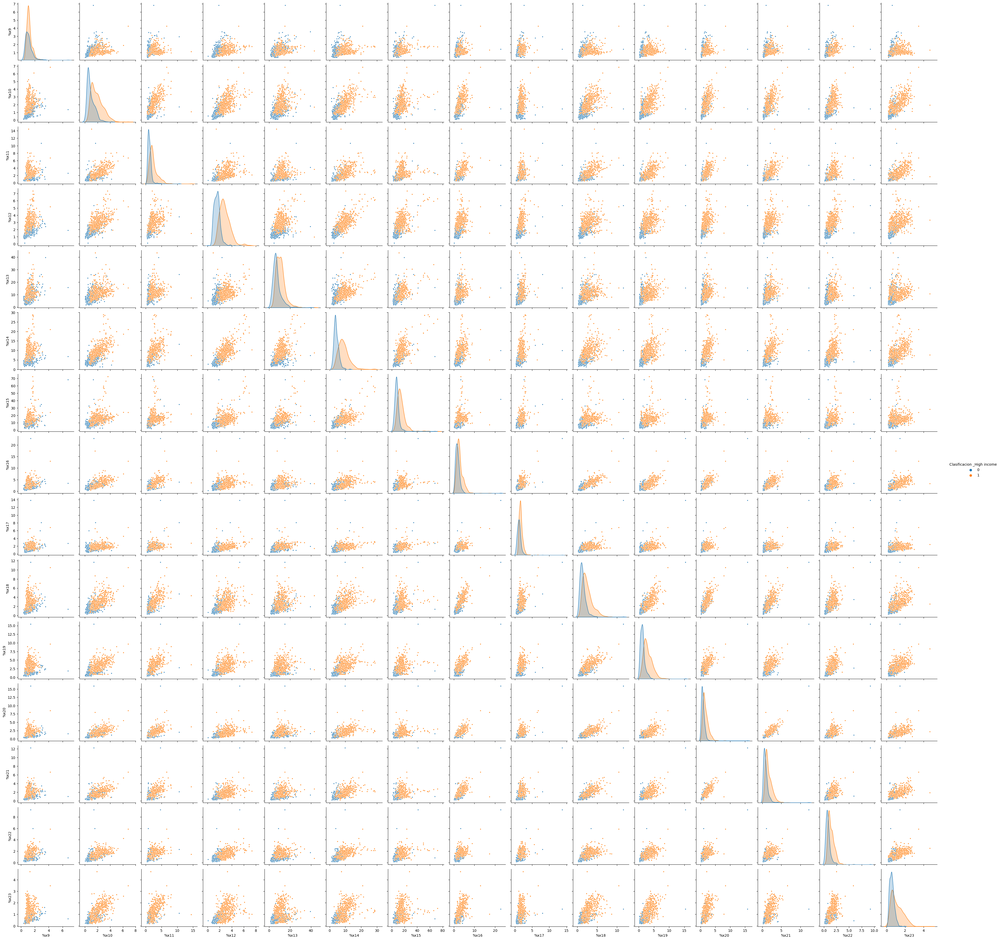

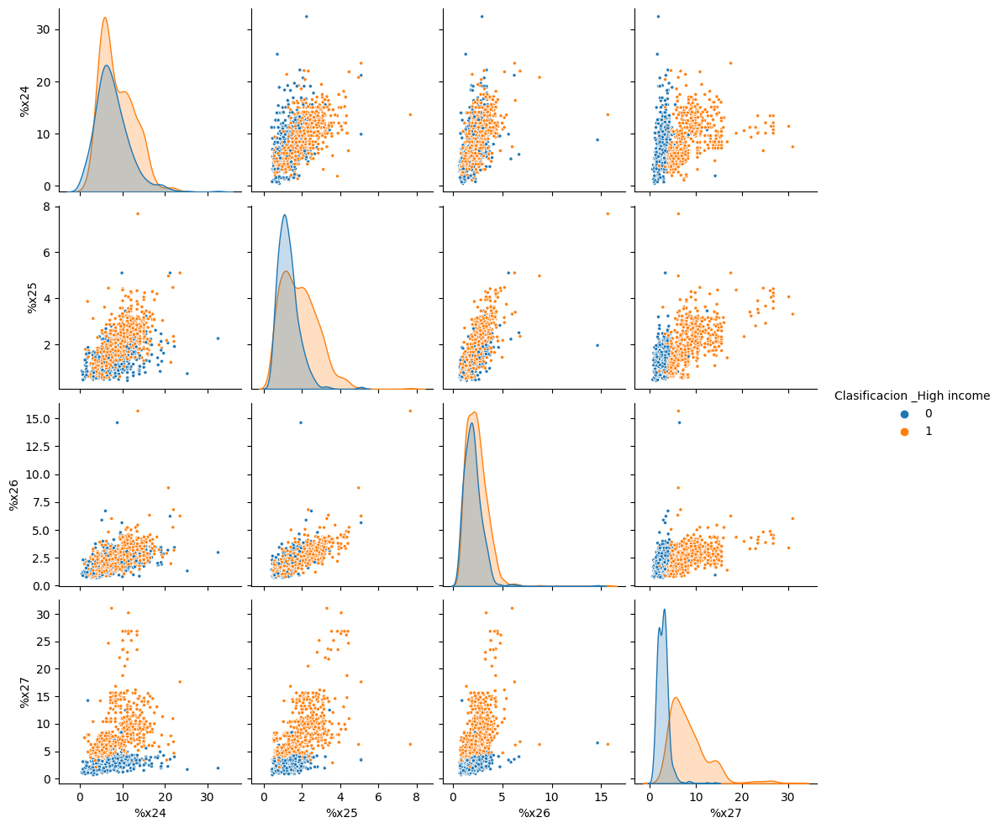

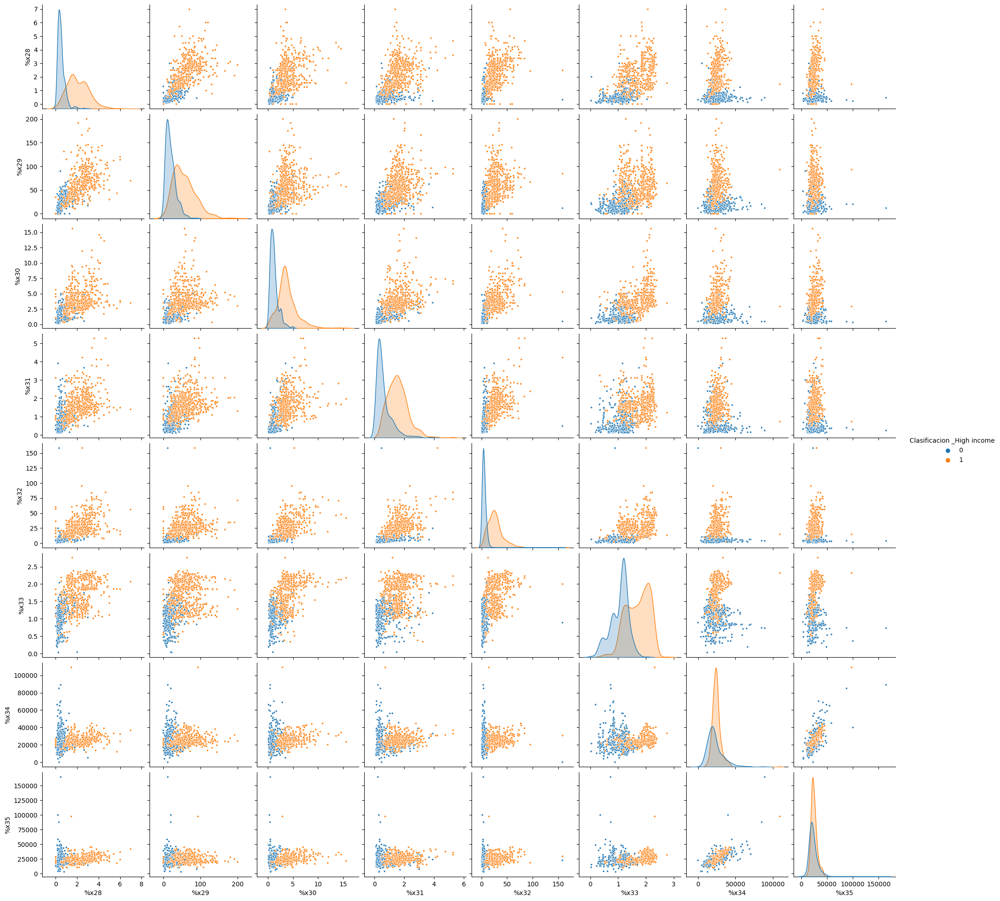

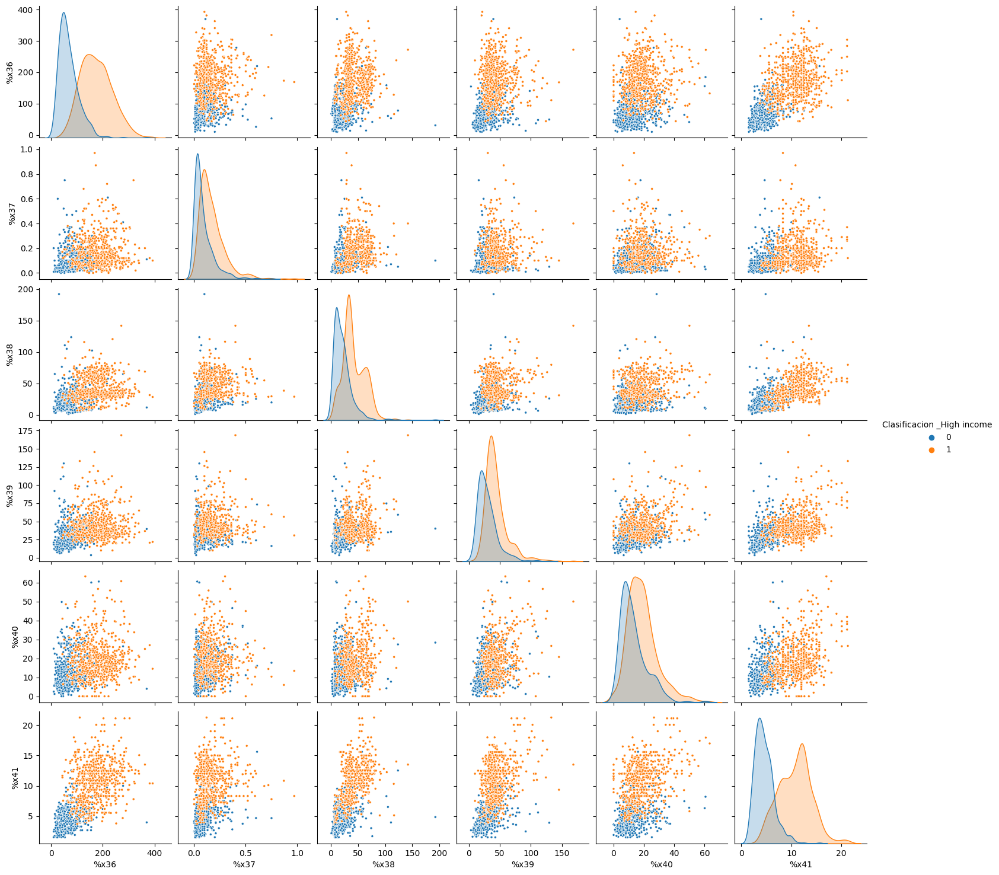

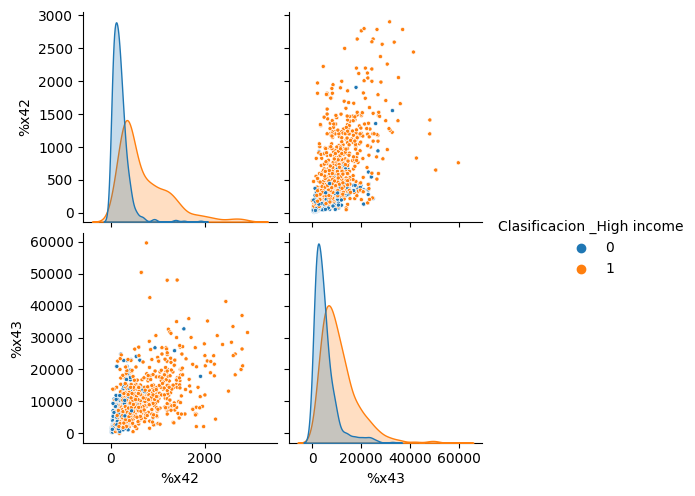

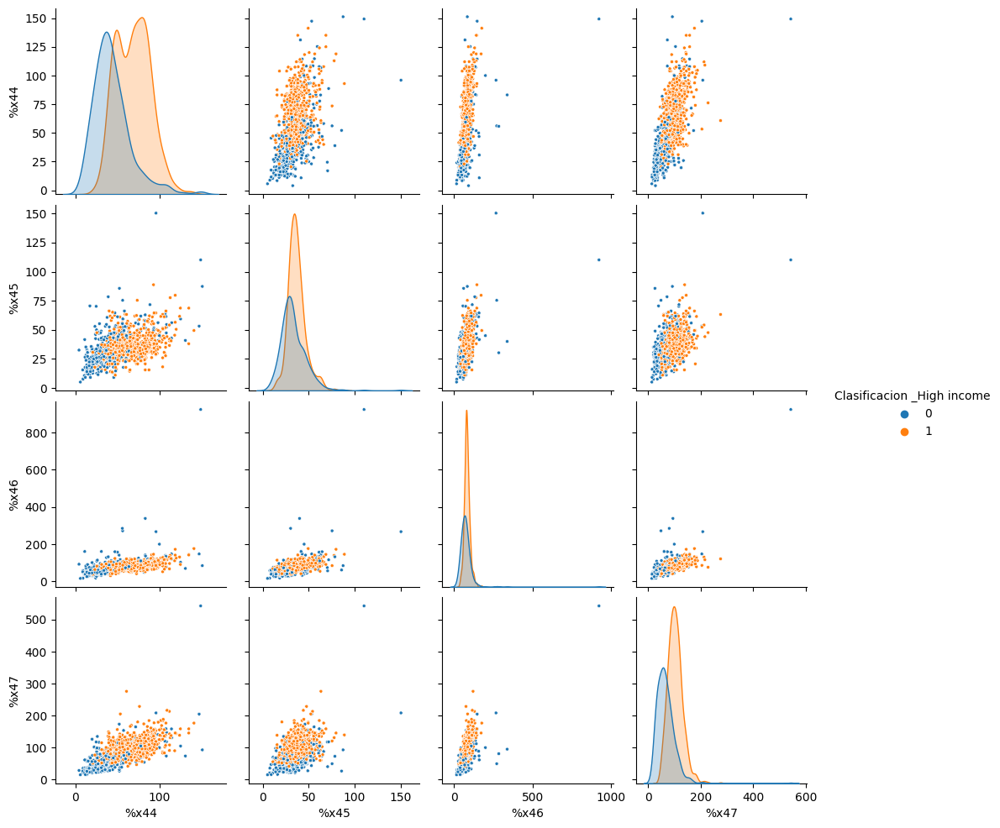

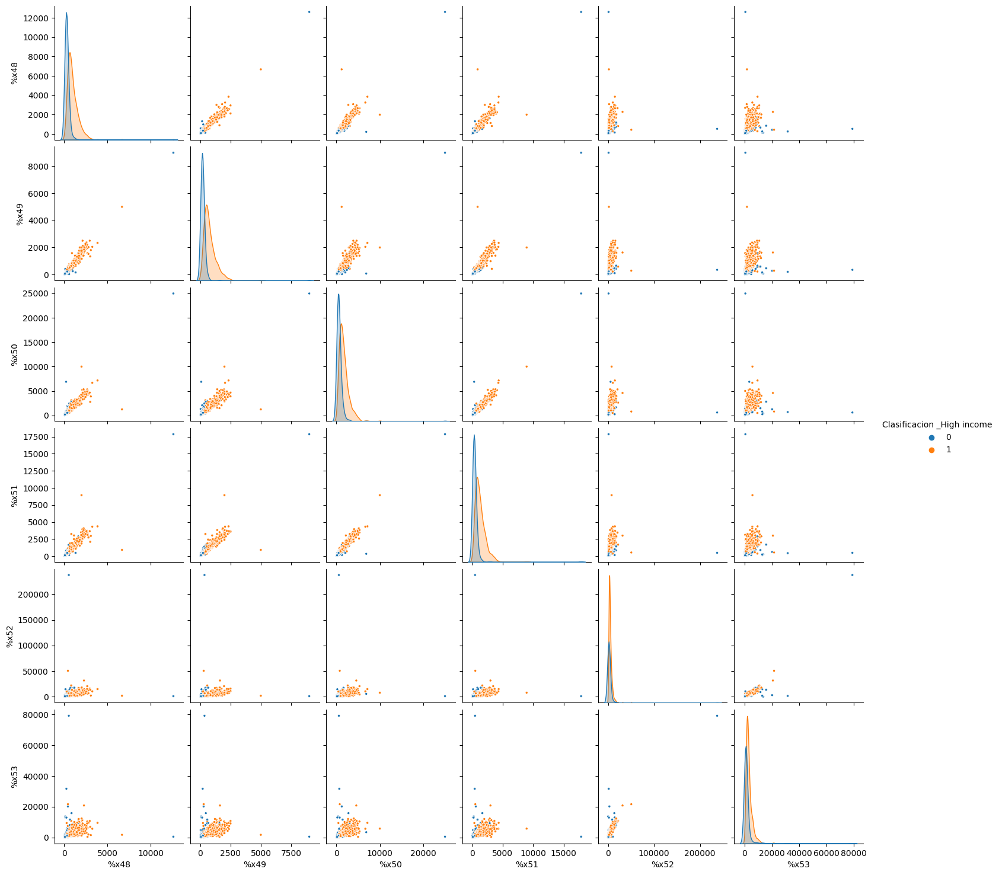

In [ ]:
alimentos_restaurantes_1=dummie_data[['%x1','%x2','%x3','%x4','%x5','%x6','%x7','%x8','Clasificacion _High income']]

alimentos_super_1=dummie_data[["%x9","%x10","%x11","%x12","%x13","%x14","%x15","%x16","%x17","%x18","%x19","%x20","%x21","%x22","%x23",'Clasificacion _High income']]
bar_1=dummie_data[['%x24','%x25','%x26','%x27','Clasificacion _High income']]
mobility_1=dummie_data[['%x28','%x29','%x30','%x31','%x32','%x33','%x34','%x35','Clasificacion _High income']]
entertainment_1=dummie_data[['%x36','%x37','%x38','%x39','%x40','%x41','Clasificacion _High income']]
school_1=dummie_data[['%x42','%x43','Clasificacion _High income']]
dress_1=dummie_data[['%x44','%x45','%x46','%x47','Clasificacion _High income']]
living_1=dummie_data[['%x48','%x49','%x50','%x51','%x52','%x53','Clasificacion _High income']]

sns.pairplot(alimentos_restaurantes_1,hue='Clasificacion _High income',markers='.')
sns.pairplot(alimentos_super_1,hue='Clasificacion _High income',markers='.')
sns.pairplot(bar_1,hue='Clasificacion _High income',markers='.')
sns.pairplot(mobility_1,hue='Clasificacion _High income',markers='.')
sns.pairplot(entertainment_1,hue='Clasificacion _High income',markers='.')
sns.pairplot(school_1,hue='Clasificacion _High income',markers='.')
sns.pairplot(dress_1,hue='Clasificacion _High income',markers='.')
sns.pairplot(living_1,hue='Clasificacion _High income',markers='.')

             %x4        %x7       %x13       %x23       %x27       %x24  \
count  14.000000  14.000000  14.000000  14.000000  14.000000  14.000000   
mean    0.601084   0.597262   0.419257   0.527300   0.540947   0.373920   
std     0.173951   0.196292   0.194381   0.206870   0.207173   0.227545   
min     0.278808   0.229837   0.244034   0.144725   0.214136  -0.031957   
25%     0.508697   0.509222   0.308928   0.437302   0.413930   0.257978   
50%     0.583358   0.610904   0.342710   0.565332   0.550839   0.357525   
75%     0.689834   0.720624   0.491601   0.602308   0.671743   0.418756   
max     1.000000   1.000000   1.000000   1.000000   1.000000   1.000000   

            %x28       %x33       %x38       %x41       %x42       %x45  \
count  14.000000  14.000000  14.000000  14.000000  14.000000  14.000000   
mean    0.567510   0.375282   0.490301   0.638573   0.544187   0.314085   
std     0.212975   0.277927   0.207840   0.173714   0.187468   0.217415   
min     0.203688  -0.031

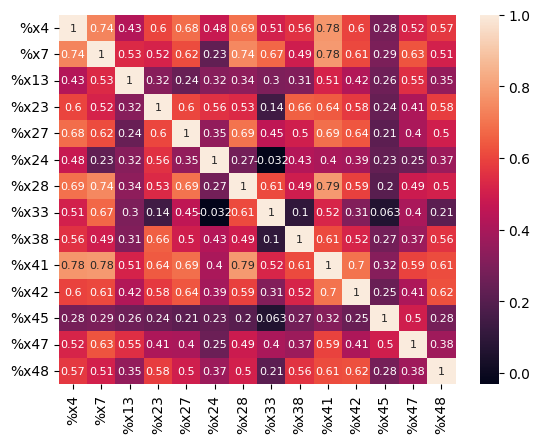

In [ ]:
Todas_Var=dummie_data[["%x4","%x7","%x13","%x23","%x27","%x24","%x28","%x33","%x38","%x41","%x42","%x45","%x47","%x48"]]
sns.heatmap(Todas_Var.corr(),annot=True,cbar      = True,
    annot_kws = {"size": 8})
print(Todas_Var.corr().describe())

Todas_Var.corr().describe().to_excel('Todas_Var.xlsx')

#Modelo_1: #28,#38,#42,#48,#7,#27,#23



In [ ]:
#Modelo_1: #28,#38,#42,#7,#27,#23
Todas_Var=dummie_data[["%x1","%x2","%x3","%x4","%x5","Clasificacion _High income"]]

[{'mean': 9.788830548926015, 'iqr': 10.620000000000001, 'cilo': 8.569719977491701, 'cihi': 9.510280022508297, 'whishi': 30.0, 'whislo': 0.67, 'fliers': array([31.7, 31.7]), 'q1': 4.38, 'med': 9.04, 'q3': 15.0}]


<Axes: ylabel='%x1'>

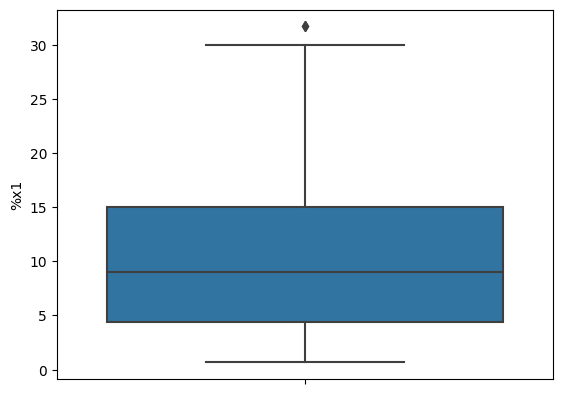

In [ ]:
from matplotlib.cbook import boxplot_stats
stats = boxplot_stats(Todas_Var["%x1"].values)
print(stats)
sns.boxplot(Todas_Var, y="%x1")

In [ ]:
Todas_Var.loc[Todas_Var["%x28"]>4.65,'%x28']=1.07

<Axes: ylabel='%x28'>

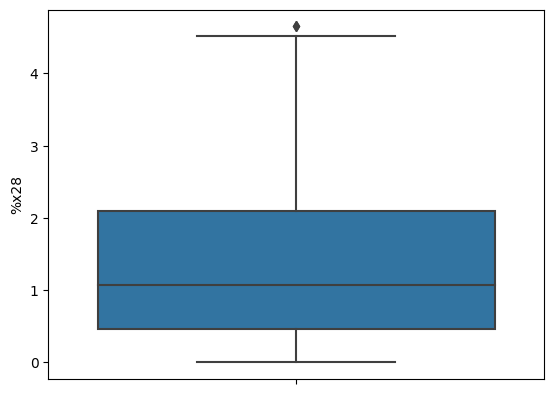

In [ ]:
sns.boxplot(Todas_Var, y="%x28")


In [ ]:
Todas_Var["%x28"]

0       0.49
1       0.56
2       0.22
3       0.53
4       0.98
        ... 
1252    2.75
1253    2.00
1254    0.22
1255    0.21
1256    3.18
Name: %x28, Length: 1257, dtype: float64

[{'mean': 33.52066825775656, 'iqr': 27.44, 'cilo': 29.324888529413585, 'cihi': 31.755111470586414, 'whishi': 83.25, 'whislo': 1.35, 'fliers': array([192.23,  97.7 , 105.25,  89.11, 103.04,  91.21, 123.68,  90.46,
       110.84, 102.49,  90.26, 142.  , 116.57, 120.61,  92.25, 115.92]), 'q1': 16.76, 'med': 30.54, 'q3': 44.2}]


<Axes: ylabel='%x38'>

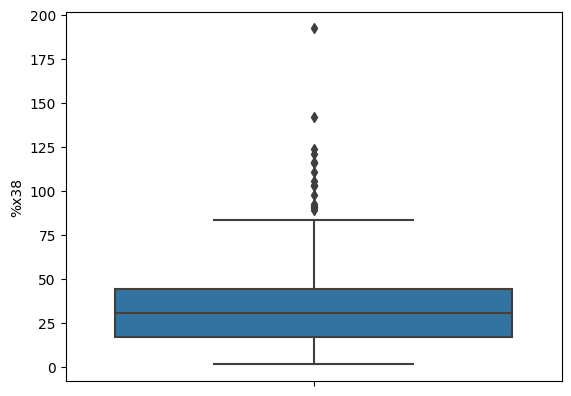

In [ ]:
stats = boxplot_stats(Todas_Var["%x38"].values)
print(stats)
sns.boxplot(Todas_Var, y="%x38")

In [ ]:
Todas_Var.loc[Todas_Var["%x38"]>83.25,'%x38']=30.54

<Axes: ylabel='%x38'>

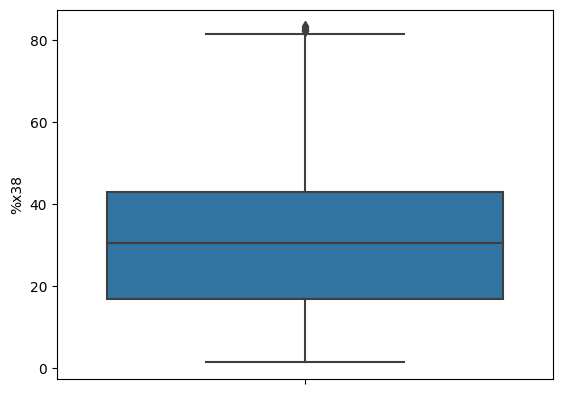

In [ ]:
sns.boxplot(Todas_Var, y="%x38")

<Axes: ylabel='%x42'>

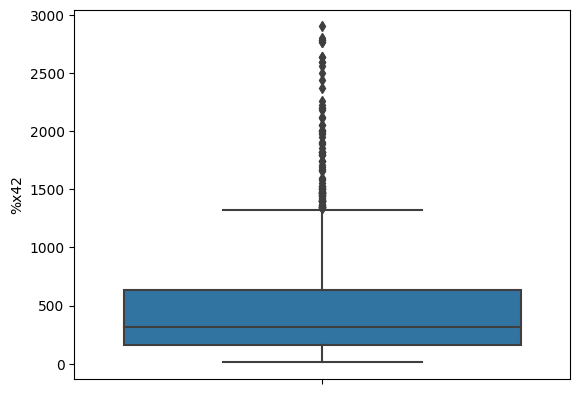

In [ ]:
sns.boxplot(Todas_Var, y="%x42")

[{'mean': 488.928321400159, 'iqr': 467.84000000000003, 'cilo': 294.6428808163576, 'cihi': 336.0771191836424, 'whishi': 1326.49, 'whislo': 10.69, 'fliers': array([1356.63, 2444.17, 1822.07, 1361.25, 1477.11, 1478.  , 1553.92,
       2260.91, 1676.03, 2055.56, 1665.79, 1528.46, 1469.44, 2375.  ,
       1362.2 , 2766.67, 1500.  , 1487.5 , 1987.5 , 1512.5 , 1341.67,
       1450.  , 1350.  , 1854.29, 2562.67, 1906.87, 1500.  , 1446.67,
       2000.  , 1415.02, 1589.38, 1396.78, 1393.36, 1400.  , 1350.  ,
       2903.61, 2050.  , 1746.05, 1900.  , 1466.67, 2766.67, 1600.  ,
       1798.1 , 1521.49, 1428.21, 1795.09, 2186.2 , 1411.38, 1464.71,
       1947.56, 1446.67, 1817.72, 2641.93, 1401.37, 2225.41, 1458.57,
       1817.72, 1973.52, 1411.38, 2200.  , 1454.18, 2200.  , 1341.25,
       2594.96, 1743.62, 1800.41, 1350.  , 1696.54, 1470.97, 1706.87,
       1890.43, 2125.  , 1817.72, 2641.93, 1576.74, 1350.  , 1481.45,
       1361.25, 2007.87, 1659.06, 1741.71, 1501.47, 2787.24, 2787.24,
     

<Axes: ylabel='%x42'>

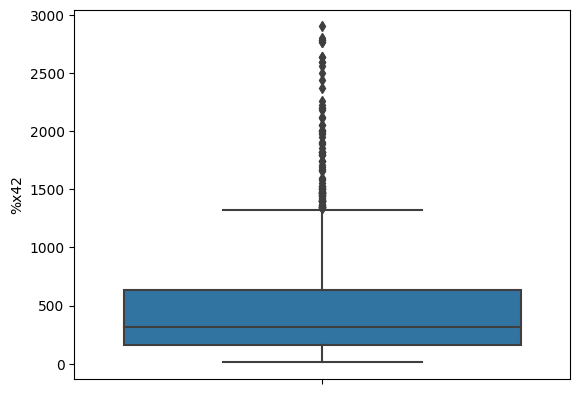

In [ ]:
stats = boxplot_stats(Todas_Var["%x42"].values)
print(stats)
sns.boxplot(Todas_Var, y="%x42")


<Axes: ylabel='%x42'>

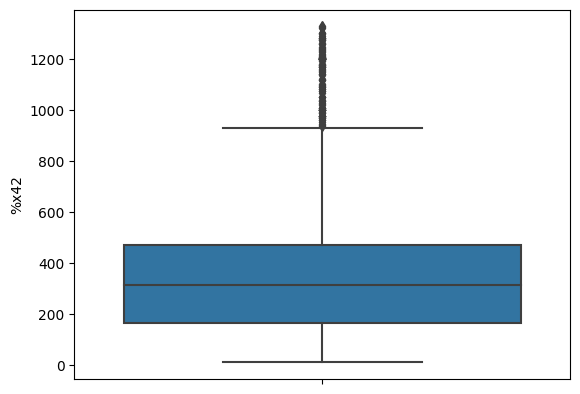

In [ ]:
Todas_Var.loc[Todas_Var["%x42"]>1326.49,'%x42']=315.36
sns.boxplot(Todas_Var, y="%x42")

[{'mean': 699.8414240254574, 'iqr': 647.0899999999999, 'cilo': 485.9052448432302, 'cihi': 543.2147551567697, 'whishi': 1893.0, 'whislo': 43.81, 'fliers': array([ 3851.51,  2311.99,  2568.47,  1969.12,  2284.16,  2585.94,
        2307.11,  2660.73,  2691.67,  2274.95,  2574.42,  1995.95,
        2806.77,  2027.6 ,  2441.85,  2157.  ,  6678.34,  2078.57,
        1989.88,  3250.  , 12608.83,  1925.  ,  2051.43,  2091.67,
        2175.  ,  2037.85,  2400.  ,  2000.  ,  2700.  ,  2575.77,
        2800.  ,  3080.33,  2025.  ,  2312.5 ,  2098.13,  2381.25,
        2333.33,  2950.  ,  1950.  ,  2500.  ,  2100.  ,  2247.5 ,
        2100.  ,  2300.  ,  2650.  ,  3002.94,  2021.08,  2000.  ,
        2132.09,  2125.  ,  2150.  ,  2566.67,  2450.  ,  1966.67,
        2241.67,  2000.  ]), 'q1': 279.66, 'med': 514.56, 'q3': 926.75}]


<Axes: ylabel='%x48'>

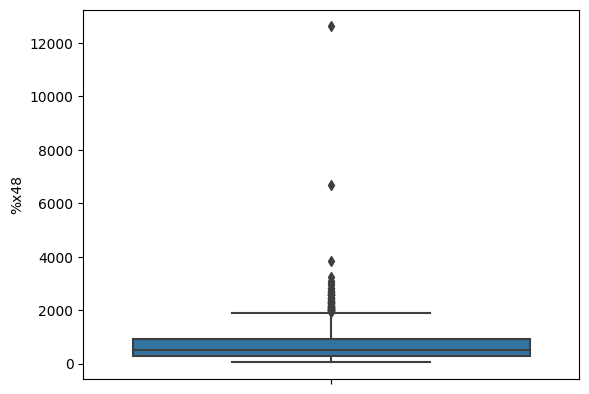

In [ ]:
stats = boxplot_stats(Todas_Var["%x48"].values)
print(stats)
sns.boxplot(Todas_Var, y="%x48")

In [ ]:
Todas_Var.loc[Todas_Var["%x48"]>1893.0,'%x48']=514.56

<Axes: ylabel='%x48'>

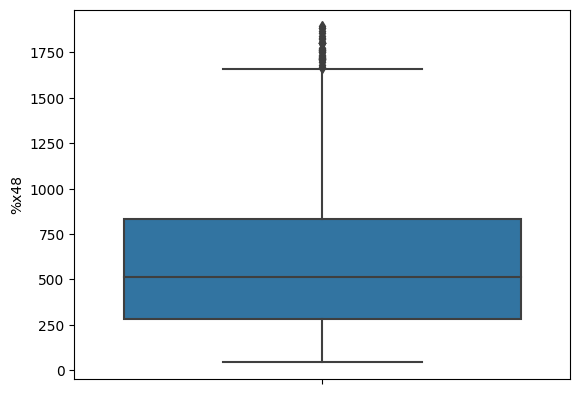

In [ ]:
sns.boxplot(Todas_Var, y="%x48")

<Axes: ylabel='%x7'>

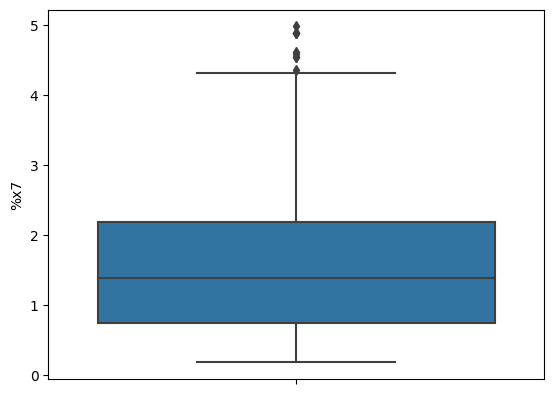

In [ ]:
sns.boxplot(Todas_Var, y="%x7")

[{'mean': 1.51291169451074, 'iqr': 1.4400000000000002, 'cilo': 1.3262332172870104, 'cihi': 1.4537667827129894, 'whishi': 4.32, 'whislo': 0.18, 'fliers': array([4.36, 4.58, 4.61, 4.54, 4.54, 4.89, 4.89, 4.98, 4.89]), 'q1': 0.74, 'med': 1.39, 'q3': 2.18}]


<Axes: ylabel='%x7'>

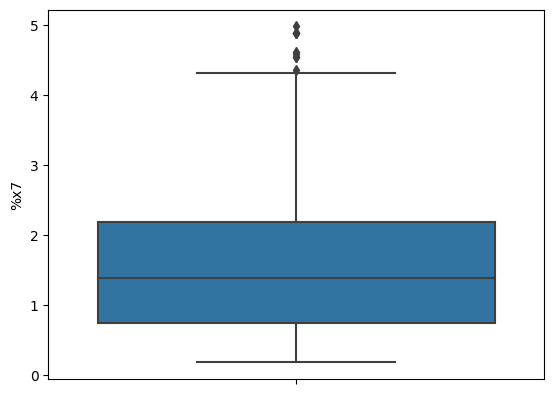

In [ ]:
stats = boxplot_stats(Todas_Var["%x7"].values)
print(stats)
sns.boxplot(Todas_Var, y="%x7")


In [ ]:
Todas_Var.loc[Todas_Var["%x7"]>4.32,'%x7']=1.51291169451074

<Axes: ylabel='%x7'>

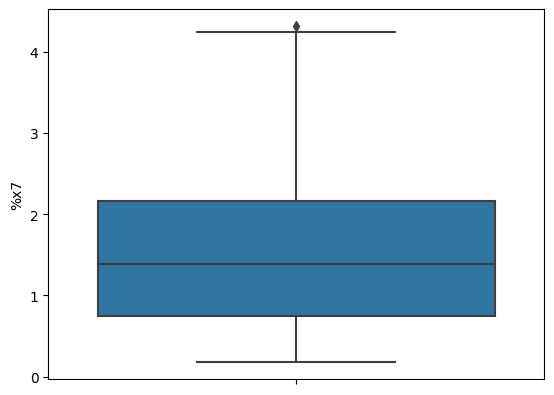

In [ ]:
sns.boxplot(Todas_Var, y="%x7")

<Axes: ylabel='%x27'>

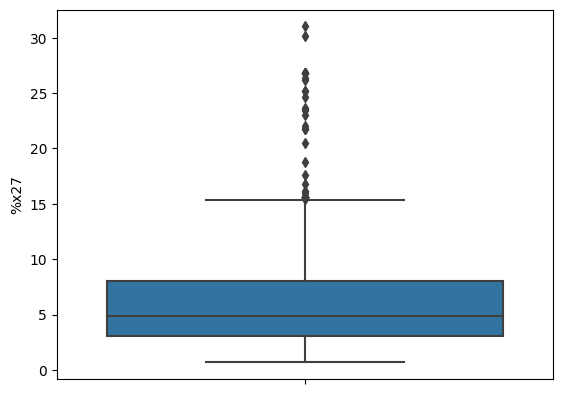

In [ ]:
sns.boxplot(Todas_Var, y="%x27")

[{'mean': 6.102585521081941, 'iqr': 4.9399999999999995, 'cilo': 4.64124450930405, 'cihi': 5.078755490695951, 'whishi': 15.32, 'whislo': 0.68, 'fliers': array([15.62, 26.82, 26.82, 15.5 , 26.82, 26.82, 21.75, 26.38, 15.58,
       23.61, 23.47, 16.15, 17.62, 25.15, 15.62, 22.03, 21.75, 15.53,
       18.78, 15.62, 15.58, 15.62, 15.47, 23.47, 15.62, 15.62, 26.82,
       30.18, 16.01, 26.15, 15.62, 25.15, 15.62, 15.58, 20.5 , 15.58,
       22.99, 16.82, 31.03, 24.65]), 'q1': 3.06, 'med': 4.86, 'q3': 8.0}]


<Axes: ylabel='%x27'>

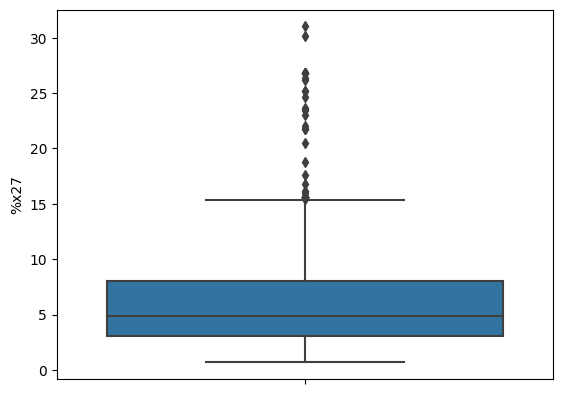

In [ ]:
stats = boxplot_stats(Todas_Var["%x27"].values)
print(stats)
sns.boxplot(Todas_Var, y="%x27")


In [ ]:
Todas_Var.loc[Todas_Var["%x27"]>15.32,'%x27']=4.86

<Axes: ylabel='%x27'>

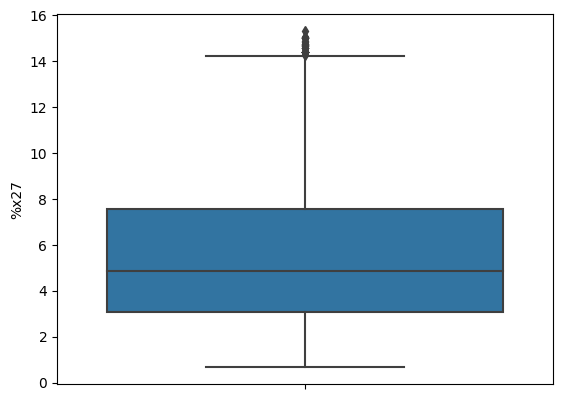

In [ ]:
sns.boxplot(Todas_Var, y="%x27")

<Axes: ylabel='%x23'>

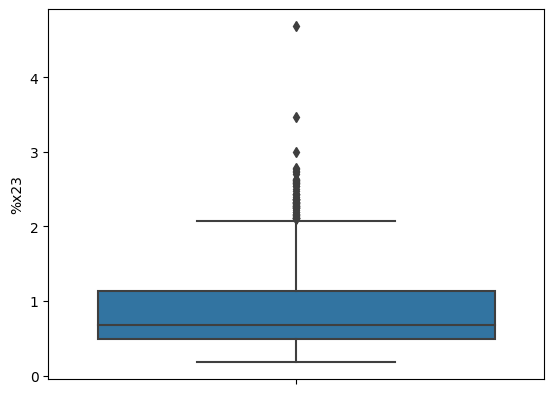

In [ ]:
sns.boxplot(Todas_Var, y="%x23")

[{'mean': 0.8848766905330151, 'iqr': 0.6399999999999999, 'cilo': 0.6516592076831158, 'cihi': 0.7083407923168843, 'whishi': 2.08, 'whislo': 0.18, 'fliers': array([2.43, 2.27, 2.2 , 2.17, 2.54, 2.22, 2.13, 2.25, 2.54, 2.64, 2.12,
       2.75, 2.37, 2.26, 3.47, 2.37, 2.17, 2.57, 2.6 , 2.32, 2.31, 2.12,
       2.15, 2.73, 2.62, 2.19, 2.25, 2.33, 2.25, 2.29, 2.27, 2.37, 2.14,
       2.43, 2.3 , 2.58, 2.4 , 2.59, 2.1 , 2.16, 2.12, 2.43, 2.32, 2.33,
       2.26, 2.37, 3.  , 4.69, 2.28, 2.48, 2.77, 2.61, 2.35, 2.7 , 2.33,
       2.12, 2.62, 2.42, 2.5 , 2.79, 2.36, 2.12]), 'q1': 0.49, 'med': 0.68, 'q3': 1.13}]


<Axes: ylabel='%x23'>

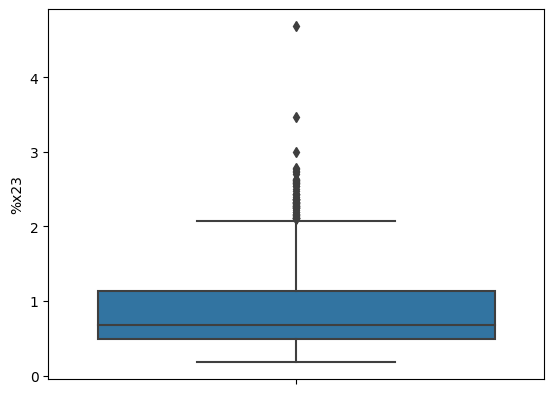

In [ ]:
stats = boxplot_stats(Todas_Var["%x23"].values)
print(stats)
sns.boxplot(Todas_Var, y="%x23")


In [ ]:
Todas_Var.loc[Todas_Var["%x23"]>2.08,'%x23']=0.68

<Axes: ylabel='%x23'>

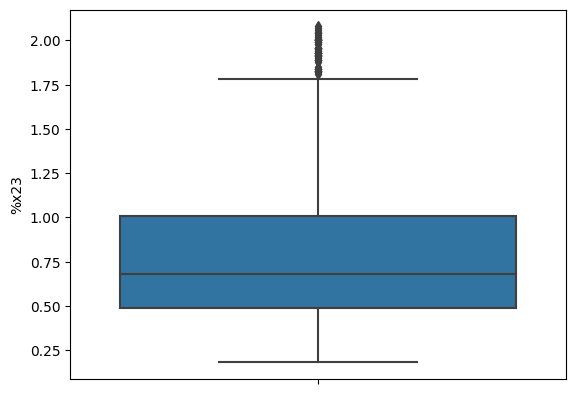

In [ ]:
sns.boxplot(Todas_Var, y="%x23")

<Axes: xlabel='Clasificacion _High income', ylabel='%x27'>

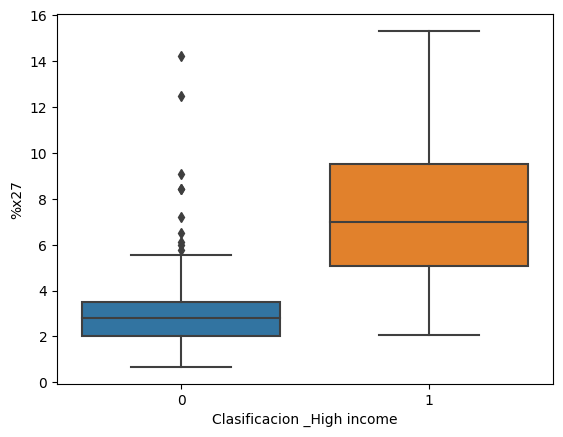

In [ ]:
#for i in range(1, 14):

sns.boxplot(Todas_Var, y="%x27", x="Clasificacion _High income")
 


<Axes: xlabel='Clasificacion _High income', ylabel='%x38'>

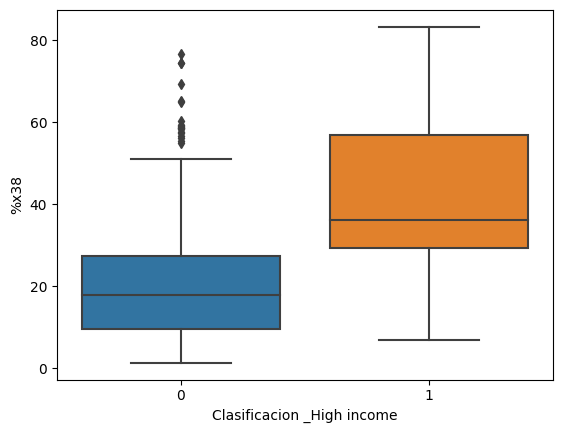

In [ ]:
sns.boxplot(Todas_Var, y="%x38", x="Clasificacion _High income")

In [ ]:
Base_modelo_1=dummie_data[["%x27","Clasificacion _High income"]]
Base_modelo_1

,%x27,Clasificacion _High income
0,4.28,0
1,3.49,0
2,2.22,0
3,2.65,0
4,3.39,1
...,...,...
1252,6.96,1
1253,10.00,1
1254,1.49,0
1255,3.98,0


In [ ]:
dummie_data.to_excel('costo_vida_final.xlsx')

In [ ]:
# determinamos el número de valores vacios por columna
print("El data set cuenta con el siguiente numero de \033[1mvalores faltantes \033[0m para cada columna.\n\033[1m{}\033[0m".format(Base_modelo_1.isnull().sum()))



El data set cuenta con el siguiente numero de valores faltantes  para cada columna.
%x27                          0
Clasificacion _High income    0
dtype: int64


In [ ]:
Base_modelo_1.describe()

,%x27,Clasificacion _High income
count,1257.000000,1257.000000
mean,6.102586,0.579157
std,4.371483,0.493891
min,0.680000,0.000000
25%,3.060000,0.000000
50%,4.860000,1.000000
75%,8.000000,1.000000
max,31.030000,1.000000


In [ ]:
Base_final_modelo_1= Base_modelo_1.fillna({'%x28':0.101683,'%x38':4.5825871,'%x42':33.825846,'%x48':52.460882})
Base_final_modelo_1 #se rellenan

,%x27,Clasificacion _High income
0,4.28,0
1,3.49,0
2,2.22,0
3,2.65,0
4,3.39,1
...,...,...
1252,6.96,1
1253,10.00,1
1254,1.49,0
1255,3.98,0


In [ ]:
X = Base_final_modelo_1.drop(columns = 'Clasificacion _High income')
y =Base_final_modelo_1['Clasificacion _High income']

X_train, X_test, y_train, y_test = train_test_split(
                                        X,
                                        y.values.reshape(-1,1),
                                        train_size   = 0.80,
                                        random_state = 0,
                                        shuffle      = True,
                                        stratify=y
                                        )


In [ ]:
import statsmodels.api as sm

X_train = sm.add_constant(X_train, prepend=True)
modelo = sm.Logit(endog=y_train, exog=X_train,)
modelo = modelo.fit()
print(modelo.summary())

Optimization terminated successfully.
         Current function value: inf
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1005
Model:                          Logit   Df Residuals:                     1003
Method:                           MLE   Df Model:                            1
Date:                Mon, 15 May 2023   Pseudo R-squ.:                     inf
Time:                        03:17:53   Log-Likelihood:                   -inf
converged:                       True   LL-Null:                        0.0000
Covariance Type:            nonrobust   LLR p-value:                     1.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.1263      0.500    -14.242      0.000      -8.107      -6.146
%x27           1.6690      0.119  

/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:1872: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


In [ ]:
predicciones = modelo.predict(exog = X_train)

In [ ]:
clasificacion = np.where(predicciones<0.5, 0, 1)
clasificacion

array([1, 1, 0, ..., 1, 0, 1])

In [ ]:
X_test = sm.add_constant(X_test, prepend=True)
predicciones = modelo.predict(exog = X_test)
clasificacion = np.where(predicciones<0.5, 0, 1)
accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = clasificacion,
            normalize = True
           )
print("")
print(f"El accuracy de test es: {100*accuracy}%")


El accuracy de test es: 92.85714285714286%


In [ ]:
confusion_matrix = pd.crosstab(
    y_test.ravel(),
    clasificacion,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix

Predicción,0,1
Real,,
0,95,9
1,17,131


In [ ]:
confusion_matrix = pd.crosstab(
    y_train.ravel(),
    clasificacion,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix

ValueError: ignored

In [ ]:
Base_modelo_2=dummie_data[["%x23","%x28","%x38","%x42","%x48","Clasificacion _High income"]]
Base_modelo_2

,%x23,%x28,%x38,%x42,%x48,Clasificacion _High income
0,0.36,0.49,7.96,73.76,223.87,0
1,0.62,0.56,16.74,1356.63,1080.07,0
2,0.42,0.22,30.45,132.74,482.85,0
3,0.65,0.53,38.02,254.89,559.52,0
4,1.06,0.98,22.06,384.01,809.83,1
...,...,...,...,...,...,...
1252,0.58,2.75,38.76,455.30,804.99,1
1253,1.96,2.00,70.41,1528.46,1800.00,1
1254,0.27,0.22,3.65,166.82,108.21,0
1255,0.36,0.21,10.74,36.73,82.64,0


In [ ]:
print("El data set cuenta con el siguiente numero de \033[1mvalores faltantes \033[0m para cada columna.\n\033[1m{}\033[0m".format(Base_modelo_2.isnull().sum()))


El data set cuenta con el siguiente numero de valores faltantes  para cada columna.
%x23                          0
%x28                          0
%x38                          0
%x42                          0
%x48                          0
Clasificacion _High income    0
dtype: int64


In [ ]:
Base_modelo_2.describe()

,%x23,%x28,%x38,%x42,%x48,Clasificacion _High income
count,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000
mean,0.884877,1.419817,33.520668,488.928321,699.841424,0.579157
std,0.574607,1.134191,21.471242,494.637267,673.796544,0.493891
min,0.180000,0.000000,1.350000,10.690000,43.810000,0.000000
25%,0.490000,0.460000,16.760000,162.910000,279.660000,0.000000
50%,0.680000,1.070000,30.540000,315.360000,514.560000,1.000000
75%,1.130000,2.180000,44.200000,630.750000,926.750000,1.000000
max,4.690000,6.980000,192.230000,2903.610000,12608.830000,1.000000


In [ ]:
Base_final_modelo_2= Base_modelo_2.fillna({'%x23':0.095110,'%x28':0.111914,'%x38':27.197461,'%x42':33.825846,'%x48':52.460882})
Base_final_modelo_2 #se rellenan

,%x23,%x28,%x38,%x42,%x48,Clasificacion _High income
0,0.36,0.49,7.96,73.76,223.87,0
1,0.62,0.56,16.74,1356.63,1080.07,0
2,0.42,0.22,30.45,132.74,482.85,0
3,0.65,0.53,38.02,254.89,559.52,0
4,1.06,0.98,22.06,384.01,809.83,1
...,...,...,...,...,...,...
1252,0.58,2.75,38.76,455.30,804.99,1
1253,1.96,2.00,70.41,1528.46,1800.00,1
1254,0.27,0.22,3.65,166.82,108.21,0
1255,0.36,0.21,10.74,36.73,82.64,0


In [ ]:
X_2 = Base_final_modelo_2.drop(columns = 'Clasificacion _High income')
y_2 =Base_final_modelo_2['Clasificacion _High income']

X2_train, X2_test, y2_train, y2_test = train_test_split(
                                        X_2,
                                        y_2.values.reshape(-1,1),
                                        train_size   = 0.8,
                                        random_state = 1234,
                                        shuffle      = True
                                    )

In [ ]:
X2_train = sm.add_constant(X2_train, prepend=True)
modelo_2 = sm.Logit(endog=y2_train, exog=X2_train,)
modelo_2 = modelo_2.fit()
print(modelo_2.summary())

Optimization terminated successfully.
         Current function value: inf
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1005
Model:                          Logit   Df Residuals:                      999
Method:                           MLE   Df Model:                            5
Date:                Sun, 14 May 2023   Pseudo R-squ.:                     inf
Time:                        18:31:26   Log-Likelihood:                   -inf
converged:                       True   LL-Null:                        0.0000
Covariance Type:            nonrobust   LLR p-value:                     1.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.2802      0.338    -12.664      0.000      -4.943      -3.618
%x23           0.4423      0.417  

/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:1872: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


In [ ]:
predicciones_2 = modelo_2.predict(exog = X2_train)

In [ ]:
clasificacion_2 = np.where(predicciones_2<0.5, 0, 1)
clasificacion_2

array([1, 1, 1, ..., 1, 0, 1])

In [ ]:
X2_test = sm.add_constant(X2_test, prepend=True)
predicciones_2 = modelo_2.predict(exog = X2_test)
clasificacion_2 = np.where(predicciones_2<0.5, 0, 1)
accuracy_2 = accuracy_score(
            y_true    = y2_test,
            y_pred    = clasificacion,
            normalize = True
           )
print("")
print(f"El accuracy de test es: {100*accuracy_2}%")


El accuracy de test es: 54.761904761904766%


In [ ]:
confusion_matrix = pd.crosstab(
    y_test.ravel(),
    clasificacion_2,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix

Predicción,0,1
Real,,
0,47,57
1,57,91


In [ ]:
#hacer la matriz con train 

In [ ]:
Base_modelo_3=dummie_data[["%x7","%x27","%x28","%x38","%x48","Clasificacion _High income"]]
Base_modelo_3

,%x7,%x27,%x28,%x38,%x48,Clasificacion _High income
0,0.48,4.28,0.49,7.96,223.87,0
1,0.52,3.49,0.56,16.74,1080.07,0
2,0.59,2.22,0.22,30.45,482.85,0
3,0.93,2.65,0.53,38.02,559.52,0
4,1.46,3.39,0.98,22.06,809.83,1
...,...,...,...,...,...,...
1252,2.54,6.96,2.75,38.76,804.99,1
1253,2.48,10.00,2.00,70.41,1800.00,1
1254,0.24,1.49,0.22,3.65,108.21,0
1255,0.46,3.98,0.21,10.74,82.64,0


In [ ]:
# determinamos el número de valores vacios por columna
print("El data set cuenta con el siguiente numero de \033[1mvalores faltantes \033[0m para cada columna.\n\033[1m{}\033[0m".format(Base_modelo_3.isnull().sum()))

El data set cuenta con el siguiente numero de valores faltantes  para cada columna.
%x7                           0
%x27                          0
%x28                          0
%x38                          0
%x48                          0
Clasificacion _High income    0
dtype: int64


In [ ]:
Base_modelo_3.describe()

,%x7,%x27,%x28,%x38,%x48,Clasificacion _High income
count,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000
mean,1.512912,6.102586,1.419817,33.520668,699.841424,0.579157
std,0.892936,4.371483,1.134191,21.471242,673.796544,0.493891
min,0.180000,0.680000,0.000000,1.350000,43.810000,0.000000
25%,0.740000,3.060000,0.460000,16.760000,279.660000,0.000000
50%,1.390000,4.860000,1.070000,30.540000,514.560000,1.000000
75%,2.180000,8.000000,2.180000,44.200000,926.750000,1.000000
max,4.980000,31.030000,6.980000,192.230000,12608.830000,1.000000


In [ ]:
Base_final_modelo_3= Base_modelo_1.fillna({'%x7':0.111914,'%x27':27.197461,'%x28':33.825846,'%x38':52.460882,'%x48':52.460882})
Base_final_modelo_3 #se rellenan

,%x28,%x38,Clasificacion _High income
0,0.49,7.96,0
1,0.56,16.74,0
2,0.22,30.45,0
3,0.53,38.02,0
4,0.98,22.06,1
...,...,...,...
1252,2.75,38.76,1
1253,2.00,70.41,1
1254,0.22,3.65,0
1255,0.21,10.74,0


In [ ]:
x_3= Base_final_modelo_3.drop(columns = 'Clasificacion _High income')
y_3 =Base_final_modelo_3['Clasificacion _High income']

X3_train, X3_test, y3_train, y3_test = train_test_split(
                                        x_3,
                                        y_3.values.reshape(-1,1),
                                        train_size   = 0.8,
                                        random_state = 1234,
                                        shuffle      = True)

In [ ]:
X3_train = sm.add_constant(X3_train, prepend=True)
modelo_3 = sm.Logit(endog=y3_train, exog=X3_train,)
modelo_3 = modelo_3.fit()
print(modelo_3.summary())

Optimization terminated successfully.
         Current function value: inf
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1005
Model:                          Logit   Df Residuals:                     1002
Method:                           MLE   Df Model:                            2
Date:                Sun, 14 May 2023   Pseudo R-squ.:                     inf
Time:                        18:31:26   Log-Likelihood:                   -inf
converged:                       True   LL-Null:                        0.0000
Covariance Type:            nonrobust   LLR p-value:                     1.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.5101      0.234    -14.982      0.000      -3.969      -3.051
%x28           3.4700      0.248  

/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:1872: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


In [ ]:
print(dummie_data.dtypes)

country                          object
%x1                             float64
%x2                             float64
%x3                             float64
%x4                             float64
%x5                             float64
%x6                             float64
%x7                             float64
%x8                             float64
%x9                             float64
%x10                            float64
%x11                            float64
%x12                            float64
%x13                            float64
%x14                            float64
%x15                            float64
%x16                            float64
%x17                            float64
%x18                            float64
%x19                            float64
%x20                            float64
%x21                            float64
%x22                            float64
%x23                            float64
%x24                            float64


In [ ]:
predicciones_3 = modelo_3.predict(exog = X3_train)

In [ ]:
X3_test = sm.add_constant(X3_test, prepend=True)
predicciones_3 = modelo_3.predict(exog = X3_test)
clasificacion_3 = np.where(predicciones_3<0.5, 0, 1)
accuracy_3 = accuracy_score( 
            y_true    = y3_test,
            y_pred    = clasificacion_3,
            normalize = True
           )
print("")
print(f"El accuracy de test es: {100*accuracy_3}%")


El accuracy de test es: 92.85714285714286%


In [ ]:
#aplicar la prueba de chi-entre modelo en r es lrtest y poner ambos modelos
# anova(modelo_nulo,modelo,test='Chisq') # los modelos deben ser anidados
#logit 
# El tercer modelo lo podríamos cambiar por alguno que tenga menos variables 
#probar supuestos de normalidad, linealidad, y Multicolinealidad
#menor devianza (influyen en algo) y verosim> moyor / curva roc bic y verosimilitud 
#chi cuadrada 
#metricas de matrix de confu/

